In [1]:
from astropy.io import fits

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np

import os
os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '0.15'

jax.config.update("jax_enable_x64", True)

## Reading and Displaying Fits File

In [2]:
def process_image(image, scale_factor=1, offset=1):
    scaled_image = (image[::scale_factor, ::scale_factor])[1::, 1::]
    cropped_image = image[70:210, 70:210]
    def safe_float32_conversion(value):
        try:
            return np.float32(value)
        except (ValueError, TypeError):
            print("This value is unjaxable: " + str(value))
    fin_image = np.nan_to_num(cropped_image)
    fin_image = np.vectorize(safe_float32_conversion)(fin_image)
    return fin_image

Filename: Fits/aumic_H_pol.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     482   ()      
  1  SCI           1 ImageHDU       140   (281, 281, 4)   float32   
  2  DQ            3 ImageHDU        64   (281, 281, 2)   uint8   


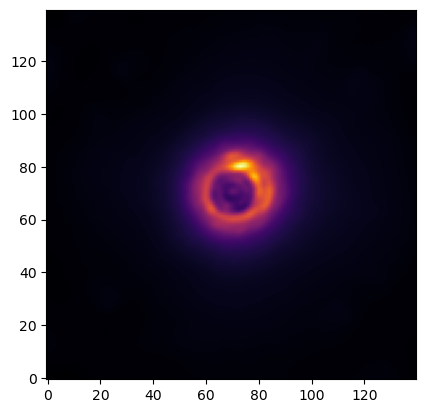

In [3]:
fits_image_filepath = "Fits/aumic_H_pol.fits"
hdul = fits.open(fits_image_filepath)

#Displays File Info
hdul.info()

# Gets Image
image = process_image(hdul['SCI'].data[0,:,:])

# Displays Image
plt.imshow(image, origin='lower', cmap='inferno')

## Displaying All Fits Files

In [4]:

fnames = os.listdir("Fits/")
print(fnames)

scale_factor = 1
images = []
ignore_fits = ['systempsf.fits']

for fname in fnames:
    if(fname in ignore_fits):
        continue
    hdul = fits.open("Fits/"+fname)
    image = process_image(hdul['SCI'].data[1,:,:])
    images.append(image)

['hd145560_H_pol.fits', 'hd146897_H_pol.fits', 'ceant_H_pol.fits', 'hd61005_H_pol.fits', 'systempsf.fits', 'hd111520_H_pol.fits', 'hd115600_H_pol.fits', 'hd129590_H_pol.fits', 'hd117214_H_pol.fits', 'betpic_H_pol.fits', 'hd35841_H_pol.fits', 'hd30447_H_pol.fits', 'hr7012_H_pol.fits', 'hd32297_H_pol.fits', 'hd110058_H_pol.fits', 'hd111161_H_pol.fits', 'hd157587_H_pol.fits', 'hr4796a_H_pol.fits', 'aumic_H_pol.fits', 'hd143675_H_pol.fits', 'hd131835_H_pol.fits', 'hd106906_H_pol.fits', 'hd114082_H_pol.fits', 'hd191089_H_pol.fits', 'hd156623_H_pol.fits']


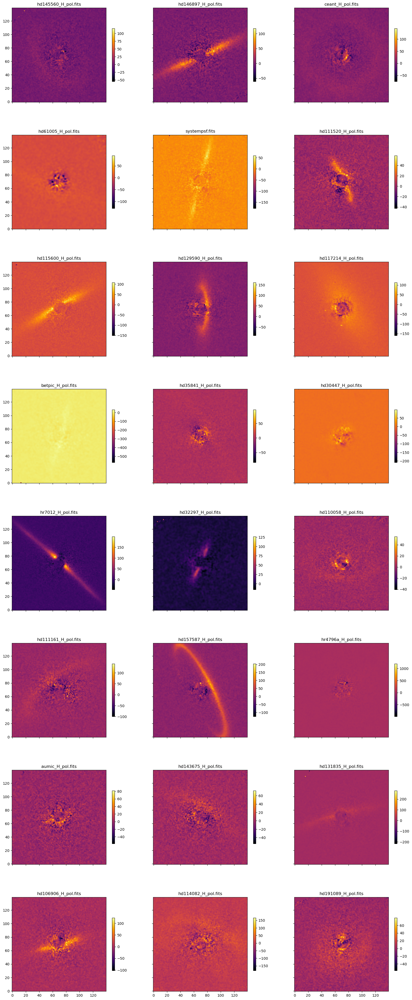

In [5]:
fig, axes = plt.subplots(8,3, sharex=True, sharey=True, figsize = (20,50))

for i in range(0, 8):
    for j in range(0, 3):
        im = axes[i][j].imshow(images[3*i+j], origin='lower', cmap='inferno')
        axes[i][j].set_title(fnames[3*i+j])
        plt.colorbar(im,ax=axes[i][j], shrink=0.5)

## Fitting Disk Models to Fits Images

In [6]:
from disk_utils_jax import jax_model_all_1d
from regression import log_likelihood_1d_pos_all_pars_spline
from scipy.optimize import minimize
from SLD_utils import *

In [7]:
# Creating error map
def create_circular_err_map(image_shape, iradius, oradius, noise_level):
    err_map = jnp.zeros(image_shape)
    center = image_shape[0]/2
    y, x = jnp.ogrid[:image_shape[0], :image_shape[1]]
    distance = jnp.sqrt((x - center) ** 2 + (y - center) ** 2)  
    err_map = jnp.where(distance <= oradius, noise_level, 1e8)
    err_map = jnp.where(distance >= iradius, err_map, 1e8)
    return err_map

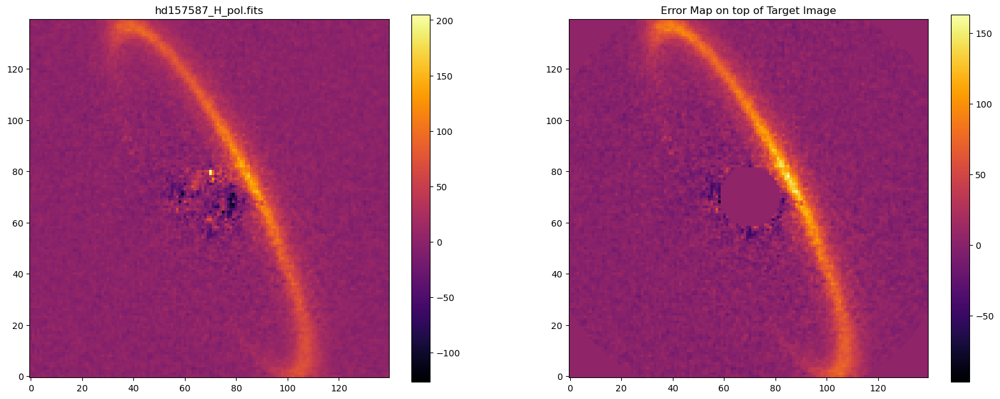

In [8]:
target_image = jnp.asarray(images[16])

fig, axes = plt.subplots(1, 2, figsize=(20,10))

im = axes[0].imshow(target_image, origin='lower', cmap = 'inferno')
axes[0].set_title(fnames[16])
plt.colorbar(im, ax=axes[0], shrink=0.75)

noise_level = 5
err_map = create_circular_err_map(target_image.shape, 12, 83, noise_level)
overlayed_image = jnp.where(err_map == 1e8, noise_level, target_image)
im = axes[1].imshow(overlayed_image, origin='lower', cmap = 'inferno')
axes[1].set_title("Error Map on top of Target Image")
plt.colorbar(im, ax=axes[1], shrink=0.75)

In [9]:

# Parameters
disk_params = {}
disk_params['inclination'] = 40. #In degrees
disk_params['position_angle'] = 50. #In Degrees
disk_params['alpha_in'] = 8. #The inner power law
disk_params['alpha_out'] = -5. #The outer power law
disk_params['flux_scaling'] = 1e6
disk_params['sma'] = 30. #This is the semi-major axis of the model in astronomical units. 
#To get this in pixels, divide by the distance to the star, to get it in arcseconds. To get it in pixeks, divide by the pixel scale.

disk_params_1d = np.array([disk_params['alpha_in'], disk_params['alpha_out'], disk_params['sma'], disk_params['inclination'],
                           disk_params['position_angle']])
spline_params_1d= jnp.full(6, 0.05)   # random knot y-values
all_pars_spline = jnp.concatenate([disk_params_1d, spline_params_1d])

In [10]:
# Have to input spline parameters like this for the method to work
init_disk = jax_model_all_1d(DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, all_pars_spline[0:5],
                                            InterpolatedUnivariateSpline_SPF.pack_pars(all_pars_spline[5:]), disk_params['flux_scaling'])

#plt.imshow(init_disk, origin='lower', cmap='inferno')
#plt.title("Initial Guess")

In [11]:
print(log_likelihood_1d_pos_all_pars_spline(all_pars_spline, DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                        disk_params['flux_scaling'], target_image, err_map))

1572026.4643615326


In [12]:
llp = lambda x: log_likelihood_1d_pos_all_pars_spline(x, DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                        disk_params['flux_scaling'], target_image, err_map, pxInArcsec=0.01414)

opt = {'disp':True,'maxiter':3000}
soln_spline = minimize(llp, all_pars_spline, options=opt, method = None)

print(soln_spline)

         Current function value: 76969.764460
         Iterations: 93
         Function evaluations: 1548
         Gradient evaluations: 129
  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 76969.76446041334
        x: [ 1.702e+01 -9.989e+00  5.288e+01  7.719e+01  2.701e+01
             6.594e-02  2.398e-02  2.295e-02  1.327e-02  6.504e-03
            -3.132e-03]
      nit: 93
      jac: [ 0.000e+00  9.766e-04  9.766e-04  0.000e+00  0.000e+00
             7.812e-03  1.758e-02  4.883e-03  2.930e-03  7.812e-03
             1.172e-02]
 hess_inv: [[ 4.533e-04  7.262e-04 ...  1.199e-07 -7.012e-06]
            [ 7.262e-04  1.218e-03 ...  2.134e-07 -1.176e-05]
            ...
            [ 1.199e-07  2.134e-07 ...  1.212e-08 -1.329e-08]
            [-7.012e-06 -1.176e-05 ... -1.329e-08  2.100e-07]]
     nfev: 1548
     njev: 129


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:708: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [13]:
# Have to input spline parameters like this for the method to work
disk_image_fit_spline = jax_model_all_1d(DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, soln_spline.x[0:5],
                                            InterpolatedUnivariateSpline_SPF.pack_pars(soln_spline.x[5:]), disk_params['flux_scaling'],
                                            pxInArcsec=0.01414)

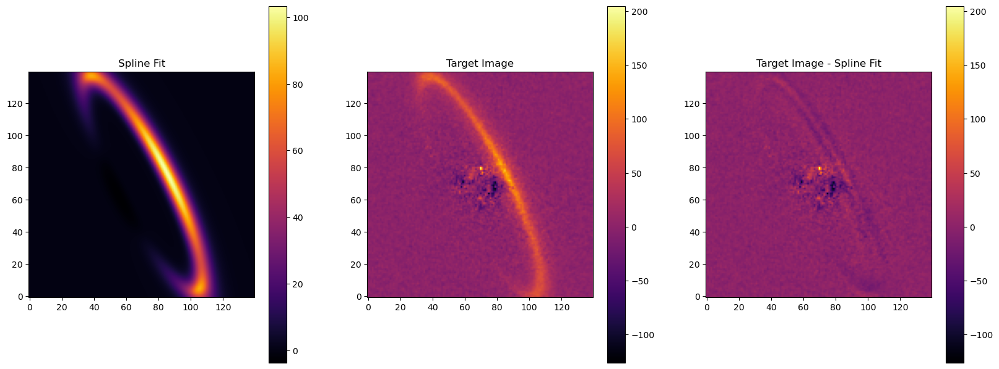

In [14]:
fig, axes = plt.subplots(1,3, figsize=(20,10))

im = axes[0].imshow(disk_image_fit_spline, origin='lower', cmap='inferno')
axes[0].set_title("Spline Fit")
plt.colorbar(im, ax=axes[0], shrink=0.75)

im = axes[1].imshow(target_image, origin='lower', cmap='inferno')
axes[1].set_title("Target Image")
plt.colorbar(im, ax=axes[1], shrink=0.75)

im = axes[2].imshow(target_image-disk_image_fit_spline, origin='lower', cmap='inferno')
axes[2].set_title("Target Image - Spline Fit")
plt.colorbar(im, ax=axes[2], shrink=0.75)

In [15]:
print(log_likelihood_1d_pos_all_pars_spline(all_pars_spline, DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                        disk_params['flux_scaling'], target_image, err_map, PSFModel=EMP_PSF, pxInArcsec=0.01414))

1202266.5282921265


In [16]:
from optimize import quick_optimize, quick_image

err_map = create_circular_err_map(target_image.shape, 12, 83, 5)
soln = quick_optimize(target_image, err_map, method = None, iters = 2000, PSFModel=EMP_PSF, pxInArcsec=0.01414)

disk_image_fit_spline = quick_image(soln, PSFModel=EMP_PSF, pxInArcsec=0.01414)

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 78775.5571528452
        x: [ 2.595e+01 -2.107e+01  5.431e+01  7.511e+01  2.667e+01
             1.503e-01  5.338e-02  5.062e-02  2.041e-02  9.969e-03
            -6.558e-03]
      nit: 111
      jac: [ 0.000e+00 -9.766e-04  0.000e+00  9.766e-04  4.883e-03
            -2.344e-02  4.883e-02 -2.002e-01 -1.465e-02 -4.883e-03
             4.297e-02]
 hess_inv: [[ 6.646e-01 -1.692e-01 ...  1.494e-04 -6.125e-05]
            [-1.692e-01  6.934e-02 ... -4.696e-05  2.440e-05]
            ...
            [ 1.494e-04 -4.696e-05 ...  7.838e-08 -4.847e-08]
            [-6.125e-05  2.440e-05 ... -4.847e-08  1.368e-07]]
     nfev: 2364
     njev: 196


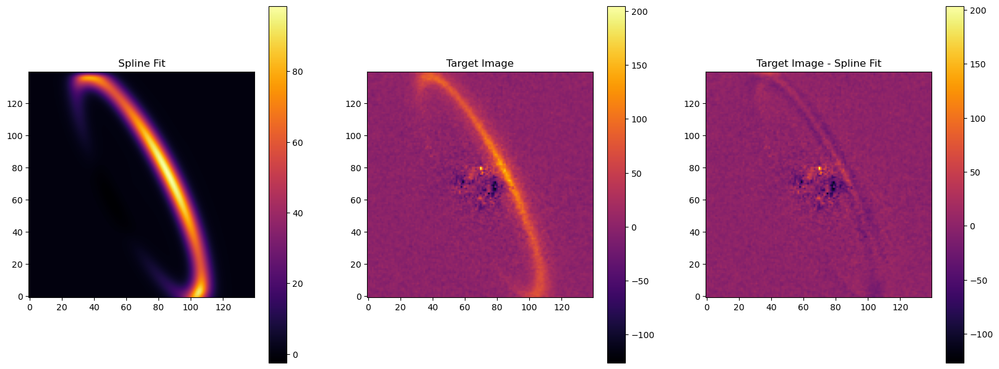

In [17]:
fig, axes = plt.subplots(1,3, figsize=(20,10))

im = axes[0].imshow(disk_image_fit_spline, origin='lower', cmap='inferno')
axes[0].set_title("Spline Fit")
plt.colorbar(im, ax=axes[0], shrink=0.75)

im = axes[1].imshow(target_image, origin='lower', cmap='inferno')
axes[1].set_title("Target Image")
plt.colorbar(im, ax=axes[1], shrink=0.75)

im = axes[2].imshow(target_image - disk_image_fit_spline, origin='lower', cmap='inferno')
axes[2].set_title("Target Image - Spline Fit")
plt.colorbar(im, ax=axes[2], shrink=0.75)

## Shifting Image Center

In [18]:
from optimize import quick_optimize_cent, quick_image_cent

In [19]:
FULL_BOUNDS = [(65, 75), (65, 75), (1, 10), (-1, 10), (10, 80), (0, 180), (0, 180),
              (0, 0.5), (0, 0.5), (0, 0.5), (0, 0.5), (0, 0.5), (0, 0.5)]

err_map = create_circular_err_map(target_image.shape, 12, 83, 15)
soln = quick_optimize_cent(target_image, err_map, method = None, iters = 2000, PSFModel=EMP_PSF, pxInArcsec=0.01414, distance = 70.77)
print(soln)

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 79364.45709850796
        x: [ 7.106e+01  7.000e+01 ...  7.871e-03 -2.941e-03]
      nit: 135
      jac: [-1.403e+00 -8.906e-01 ...  6.241e+01 -5.832e+01]
 hess_inv: [[ 2.740e-02  7.449e-05 ...  4.547e-05 -2.451e-05]
            [ 7.449e-05  1.773e-04 ...  4.466e-07 -3.547e-07]
            ...
            [ 4.547e-05  4.466e-07 ...  3.253e-07 -2.157e-07]
            [-2.451e-05 -3.547e-07 ... -2.157e-07  7.783e-07]]
     nfev: 3666
     njev: 261
[ 7.10586051e+01  7.00000000e+01  2.80561216e+01 -1.11259824e+01
  7.51467245e+01  7.62042667e+01  2.65073601e+01  9.42743937e-02
  3.43757181e-02  3.55648426e-02  1.90778627e-02  7.87056279e-03
 -2.94100006e-03]


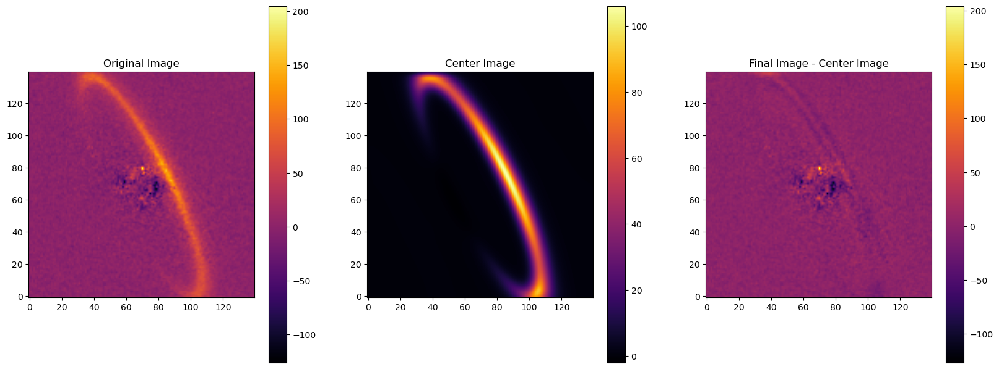

In [20]:
cent_image = quick_image_cent(soln, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = 70.77)

fig, axes = plt.subplots(1,3, figsize=(20,10))

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Original Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)

im = axes[1].imshow(cent_image, origin='lower', cmap='inferno')
axes[1].set_title("Center Image")
plt.colorbar(im, ax=axes[1], shrink=0.75)

im = axes[2].imshow(target_image-cent_image, origin='lower', cmap='inferno')
axes[2].set_title("Final Image - Center Image")
plt.colorbar(im, ax=axes[2], shrink=0.75)

## Fitting Distribution Parameters as Well

In [21]:
from optimize import quick_optimize_full_opt, quick_image_full_opt
from regression import log_likelihood_1d_full_opt
from datetime import datetime

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 46568.4942188709
        x: [ 1.670e+02  1.268e+02 ...  6.723e-02  6.235e-02]
      nit: 120
      jac: [-1.420e+00  0.000e+00 ...  1.843e+04 -5.674e+03]
 hess_inv: [[ 1.885e+01  1.567e+01 ...  7.681e-03  7.337e-03]
            [ 1.567e+01  1.303e+01 ...  6.371e-03  6.079e-03]
            ...
            [ 7.681e-03  6.371e-03 ...  3.411e-06  3.376e-06]
            [ 7.337e-03  6.079e-03 ...  3.376e-06  3.408e-06]]
     nfev: 4818
     njev: 300
[ 1.66955632e+02  1.26819289e+02  7.81642743e+01  7.68606055e+01
  2.65024539e+01  7.20976522e+01  7.00811257e+01 -3.16705123e-01
  3.64852702e+00  1.81765898e+00 -1.01836727e+02  9.31431421e-02
  7.62429899e-02  6.72332204e-02  6.23516494e-02]
0:01:05.754648


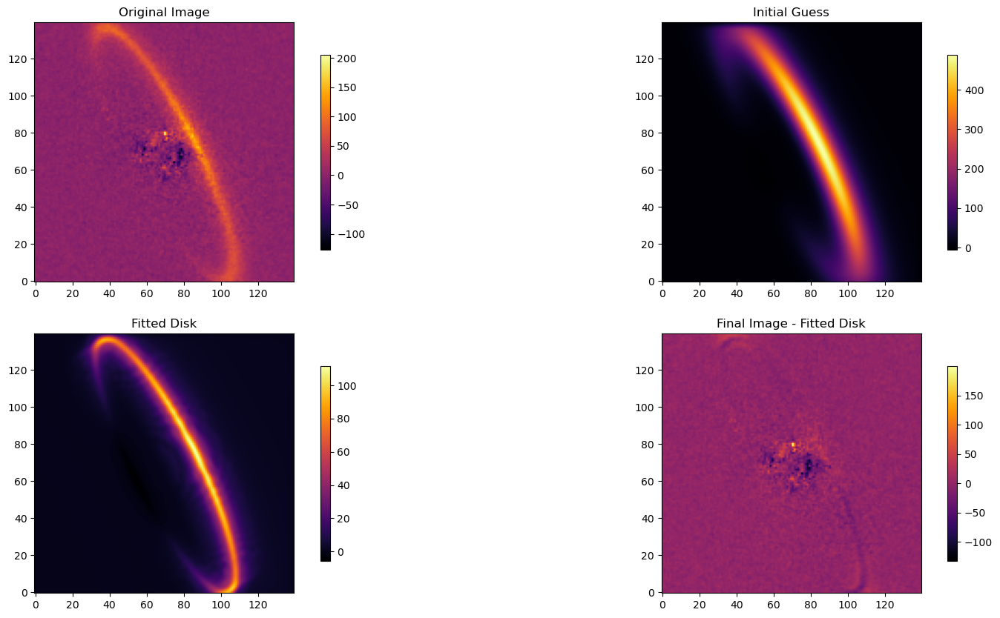

In [22]:
# Creating error map
def create_circular_err_map(image_shape, iradius, oradius, noise_level):
    err_map = jnp.zeros(image_shape)
    center = image_shape[0]/2
    y, x = jnp.ogrid[:image_shape[0], :image_shape[1]]
    distance = jnp.sqrt((x - center) ** 2 + (y - center) ** 2)  
    err_map = jnp.where(distance <= oradius, noise_level, 0)
    err_map = jnp.where(distance >= iradius, err_map, 0)
    return err_map

def process_image(image, scale_factor=1, offset=1):
    scaled_image = (image[::scale_factor, ::scale_factor])[1::, 1::]
    cropped_image = image[70:210, 70:210]
    def safe_float32_conversion(value):
        try:
            return np.float32(value)
        except (ValueError, TypeError):
            print("This value is unjaxable: " + str(value))
    fin_image = np.nan_to_num(cropped_image)
    fin_image = np.vectorize(safe_float32_conversion)(fin_image)
    return fin_image

def get_inc_bounded_knots(inclination, num_knots, buffer = 0):
    return jnp.linspace(jnp.cos(jnp.deg2rad(inclination-buffer)), jnp.cos(jnp.deg2rad(180-inclination+buffer)), num_knots)


hdul = fits.open("Fits/hr4796a_H_pol.fits")
target_image = process_image(hdul['SCI'].data[1,:,:])

from optimize import quick_optimize_full_opt, quick_image_full_opt

jax.config.update("jax_debug_nans", True)

err_map = create_circular_err_map(target_image.shape, 12, 83, 10)

knots = get_inc_bounded_knots(76.5, 4, buffer = 0)
init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots)
init_disk_guess = jnp.array([5., -5., 78.5, 76.5, 26.1])
init_cent_guess = jnp.array([70., 70.])
distr_guess = jnp.array([0, 3, 2, 1])
init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])

init_image = quick_image_full_opt(init_guess, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = 72.78, knots=knots)

llp = lambda x: log_likelihood_1d_full_opt(x, 
                    DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                    1e6, target_image, err_map, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = 72.78,
                    knots=knots)


# 0: alpha_in, 1: alpha_out, 2: sma, 3: inclination, 4: position_angle, 5: xc, 6: yc, 7: e, 8: ksi, 9: gamma, 10: beta
start = datetime.now()
soln = quick_optimize_full_opt(target_image, err_map, init_params=init_guess, method = None, iters = 1000, PSFModel=EMP_PSF, pxInArcsec=0.01414, distance = 72.78, knots = knots)
end = datetime.now()
print(soln)
print(end-start)

cent_image = quick_image_full_opt(soln, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = 72.78, knots=knots)

fig, axes = plt.subplots(2,2, figsize=(20,10))

im = axes[0][0].imshow(target_image, origin='lower', cmap='inferno')
axes[0][0].set_title("Original Image")
plt.colorbar(im, ax=axes[0][0], shrink=0.75)

im = axes[0][1].imshow(init_image, origin='lower', cmap='inferno')
axes[0][1].set_title("Initial Guess")
plt.colorbar(im, ax=axes[0][1], shrink=0.75)

im = axes[1][0].imshow(cent_image, origin='lower', cmap='inferno')
axes[1][0].set_title("Fitted Disk")
plt.colorbar(im, ax=axes[1][0], shrink=0.75)

im = axes[1][1].imshow(target_image-cent_image, origin='lower', cmap='inferno')
axes[1][1].set_title("Final Image - Fitted Disk")
plt.colorbar(im, ax=axes[1][1], shrink=0.75)

In [23]:
print(soln)

[ 1.66955632e+02  1.26819289e+02  7.81642743e+01  7.68606055e+01
  2.65024539e+01  7.20976522e+01  7.00811257e+01 -3.16705123e-01
  3.64852702e+00  1.81765898e+00 -1.01836727e+02  9.31431421e-02
  7.62429899e-02  6.72332204e-02  6.23516494e-02]


## MCMC Model Time!

In [24]:
from mcmc_model import MCMC_model

Running burn-in...


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


Running production...


ValueError: Provided figure has 225 axes, but data has dimensions K=11

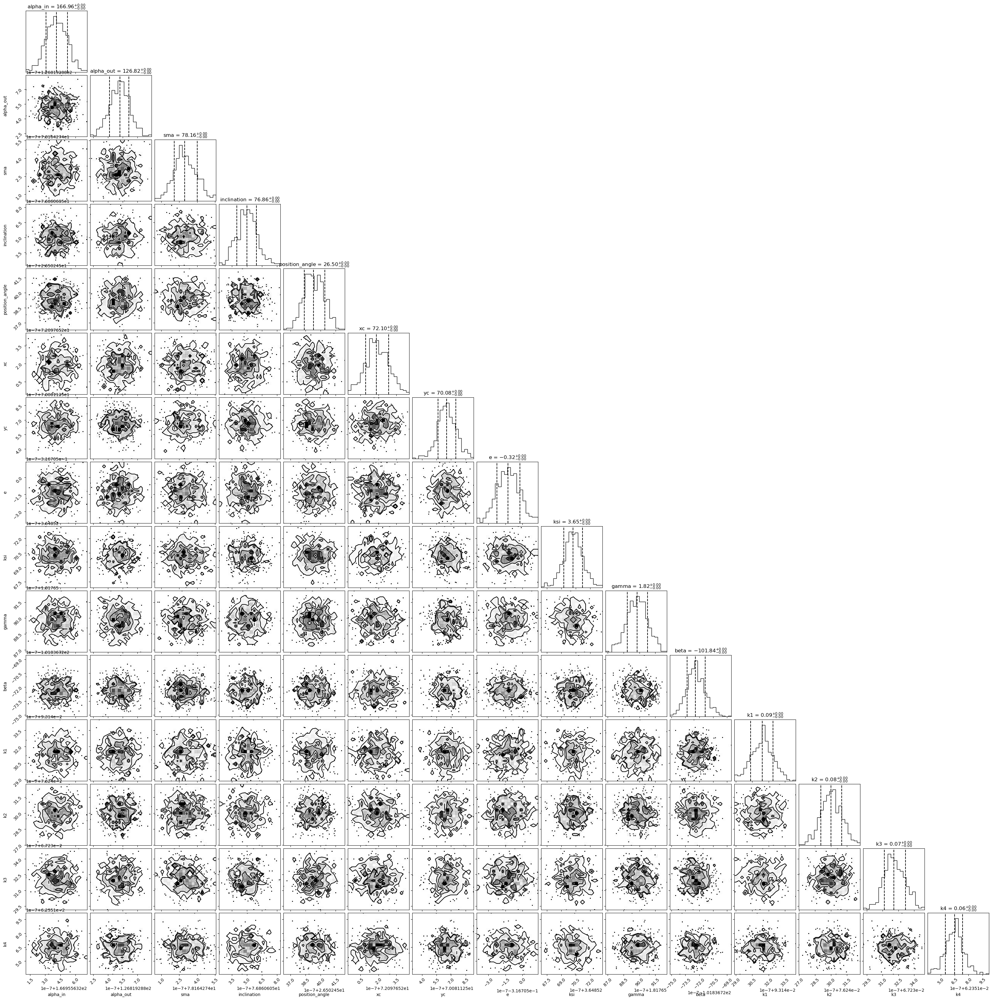

In [27]:
num_knots = 4

llp = lambda x: log_likelihood_1d_full_opt(x, 
                    DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                    1e6, target_image, err_map, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = 72.78,
                    knots=knots)


DISK_BOUNDS = np.array([np.array([1, -10, 10, 0, 0]), np.array([10, -1, 80, 180, 180])])
CENT_AND_DISTR_BOUNDS = np.array([np.array([65, 65, -1, 0, 0, -200]), np.array([75, 75, 1, 5, 5, 100])])
SPLINE_BOUNDS = np.array([np.zeros(num_knots), np.ones(num_knots)])
BOUNDS = np.array([np.concatenate([DISK_BOUNDS[0], CENT_AND_DISTR_BOUNDS[0], SPLINE_BOUNDS[0]]),
                    np.concatenate([DISK_BOUNDS[1], CENT_AND_DISTR_BOUNDS[1], SPLINE_BOUNDS[1]])])

start = datetime.now()
mc_model = MCMC_model(llp, BOUNDS)
mc_model.run(soln, nconst = 1e-7)
labels = ['alpha_in', 'alpha_out', 'sma', 'inclination', 'position_angle', 'xc', 'yc', 'e', 'ksi', 'gamma', 'beta']
for i in range(0, num_knots):
    labels.append('k'+str(i+1))
mc_model.show_corner_plot(labels, truths=soln)
end = datetime.now()
print(end-start)